In [55]:
import numpy as np, uproot as ur, awkward as ak, pandas as pd
import matplotlib.pyplot as plt
import os, sys
import pickle
import scipy.stats as st
from collections import defaultdict
from scipy.optimize import curve_fit
from matplotlib.colors import LogNorm

import mplhep as hep
plt.figure()
hep.style.use("CMS")
plt.close()

def gaus(x, amp, mean, sigma):
    return amp * np.exp( -(x - mean)**2 / (2*sigma**2) ) 
    
def theta_reconstruct(x, y, z):
    return np.degrees(np.arccos(abs(z)/np.sqrt(x**2+y**2+z**2)))

def phi_reconstruct(x, y, z):
    return np.degrees(np.arctan2(y, x))

def vector_angle_reconstruct(x, y, z):
    data = np.concatenate((np.array(x)[:, np.newaxis], 
                           np.array(y)[:, np.newaxis], 
                           np.array(z)[:, np.newaxis]), 
                          axis=1)
    datamean = data.mean(axis=0)
    centered_data = data - datamean

    _, _, vv = np.linalg.svd(centered_data)
    direction_vector = vv[0]
    if direction_vector[2] > 0:
        direction_vector *= -1
        
    x_vec, y_vec, z_vec = direction_vector
    
    theta = theta_reconstruct(x_vec, y_vec, z_vec)
    phi = phi_reconstruct(x_vec, y_vec, z_vec)
    
    return theta, phi
    
def get_xyz_board_mapping_fast(df, dg):
    channels = dg.columns
    board = np.array([x[0] if isinstance(x, list) and len(x) > 0 else np.nan 
                     for x in dg.loc['Board']])
    x = np.array([x[0] if isinstance(x, list) and len(x) > 0 else np.nan 
                for x in dg.loc['X']])
    y = np.array([x[0] if isinstance(x, list) and len(x) > 0 else np.nan 
                for x in dg.loc['Y']])
    z = np.array([x[0] if isinstance(x, list) and len(x) > 0 else np.nan 
                for x in dg.loc['Z']])
    
    xyz_board = np.column_stack((board, x, y, z))
    
    channel_to_idx = {ch: i for i, ch in enumerate(channels)}
    
    rows, cols = np.where(df)
    true_channels = df.columns[cols]
    
    row_dict = defaultdict(list)
    for row, ch in zip(rows, true_channels):
        if ch in channel_to_idx:
            row_dict[row].append(channel_to_idx[ch])
    
    results = []
    for i in range(len(df)):
        if i in row_dict:
            idxs = row_dict[i]
            results.append(xyz_board[idxs])
        else:
            results.append(np.empty((0, 4)))
    
    return results

def datTXT_to_DF(path, max_events=None):
    with open(path) as f:
        lines = f.read().split('\n')

    data = []
    tags = None
    event_count = 0
    collecting = True

    for line in lines:
        if line.strip() == "" or line.startswith("//"):
            continue

        split = line.split()

        # Count events by detecting lines with 7 items
        if len(split) == 7:
            if max_events is not None and event_count >= max_events:
                collecting = False
                break
            event_count += 1
            #continue  # This is just a separator/indicator line, skip it

        if not collecting or len(split) < 4:
            continue  # skip malformed lines or if we're done collecting

        # First non-comment, valid line sets column headers
        if tags is None:
            tags = split[-3:]  # e.g., LG, HG, etc.
            continue

        CAEN, CAEN_ch, LG, HG = split[:4]
        channel = int(CAEN) * 64 + int(CAEN_ch)

        data.append({
            "Event": event_count,
            "CAEN": int(CAEN),
            "CAEN_ch": int(CAEN_ch),
            "channel": channel,
            "LG": float(LG),
            "HG": float(HG)
        })

    return pd.DataFrame(data)

from scipy.stats import poisson, norm
import boost_histogram as bh


def theta_x(x, y, z):
    return x/z

def theta_y(x, y, z):
    return y/z

def theta_x_y(x, y, z):
    data = np.concatenate((np.array(x)[:, np.newaxis], 
                           np.array(y)[:, np.newaxis], 
                           np.array(z)[:, np.newaxis]), 
                          axis=1)
    datamean = data.mean(axis=0)
    centered_data = data - datamean

    _, _, vv = np.linalg.svd(centered_data)
    direction_vector = vv[0]
    if direction_vector[2] > 0:
        direction_vector *= -1
        
    x_vec, y_vec, z_vec = direction_vector
    
    tanx = theta_x(x_vec, y_vec, z_vec)
    tany = theta_y(x_vec, y_vec, z_vec)
    
    return tanx, tany


def poisson_to_Z(N, lam):
    N = np.asarray(N, dtype=float)
    lam = np.asarray(lam, dtype=float)
    
    # Poisson CDF
    p = np.where(N >= lam,
                 poisson.cdf(N, lam),
                 1.0 - poisson.cdf(N, lam))
    
    # clip to avoid 0 or 1
    eps = 1e-16
    p = np.clip(p, eps, 1 - eps)
    
    # sign convention
    s = np.sign(lam - N)
    
    return s * norm.ppf(p)

In [56]:
import numpy as np, uproot as ur, awkward as ak, pandas as pd
import matplotlib.pyplot as plt
import os, sys
import pickle
import scipy.stats as st
from collections import defaultdict
from scipy.optimize import curve_fit
from matplotlib.colors import LogNorm
from matplotlib.patches import Rectangle
from scipy.stats import poisson, norm
from scipy.spatial import ConvexHull
import fnmatch


import mplhep as hep
plt.figure()
hep.style.use("CMS")
plt.close()

def gaus(x, amp, mean, sigma):
    return amp * np.exp( -(x - mean)**2 / (2*sigma**2) ) 

def phi_reconstruct(x, y, z):
    return np.degrees(np.arctan2(y, x))
    
def theta_reconstruct(x, y, z):
    return np.degrees(np.arccos(abs(z)/np.sqrt(x**2+y**2+z**2)))
def theta_x(x, y, z):
    return x/z

def theta_y(x, y, z):
    return y/z
def vector_angle_reconstruct(x, y, z):
    data = np.concatenate((np.array(x)[:, np.newaxis], 
                           np.array(y)[:, np.newaxis], 
                           np.array(z)[:, np.newaxis]), 
                          axis=1)
    datamean = data.mean(axis=0)
    centered_data = data - datamean

    _, _, vv = np.linalg.svd(centered_data)
    direction_vector = vv[0]
    if direction_vector[2] > 0:
        direction_vector *= -1
        
    x_vec, y_vec, z_vec = direction_vector
    
    theta = theta_reconstruct(x_vec, y_vec, z_vec)
    phi = phi_reconstruct(x_vec, y_vec, z_vec)
    
    return theta, phi
    
def theta_x_y(x, y, z):
    data = np.concatenate((np.array(x)[:, np.newaxis], 
                           np.array(y)[:, np.newaxis], 
                           np.array(z)[:, np.newaxis]), 
                          axis=1)
    datamean = data.mean(axis=0)
    centered_data = data - datamean

    _, _, vv = np.linalg.svd(centered_data)
    direction_vector = vv[0]
    if direction_vector[2] > 0:
        direction_vector *= -1
        
    x_vec, y_vec, z_vec = direction_vector
    
    tanx = theta_x(x_vec, y_vec, z_vec)
    tany = theta_y(x_vec, y_vec, z_vec)
    
    return tanx, tany

In [3]:
num_channels = 64
num_boards = 2

free_pedestal_file = 'data/2_planar/Run112_list.txt'
free_pedestal_df = datTXT_to_DF(free_pedestal_file)

free_cosmic_file = 'data/2_planar/Run115_list.txt'
free_cosmic_df = datTXT_to_DF(free_cosmic_file)


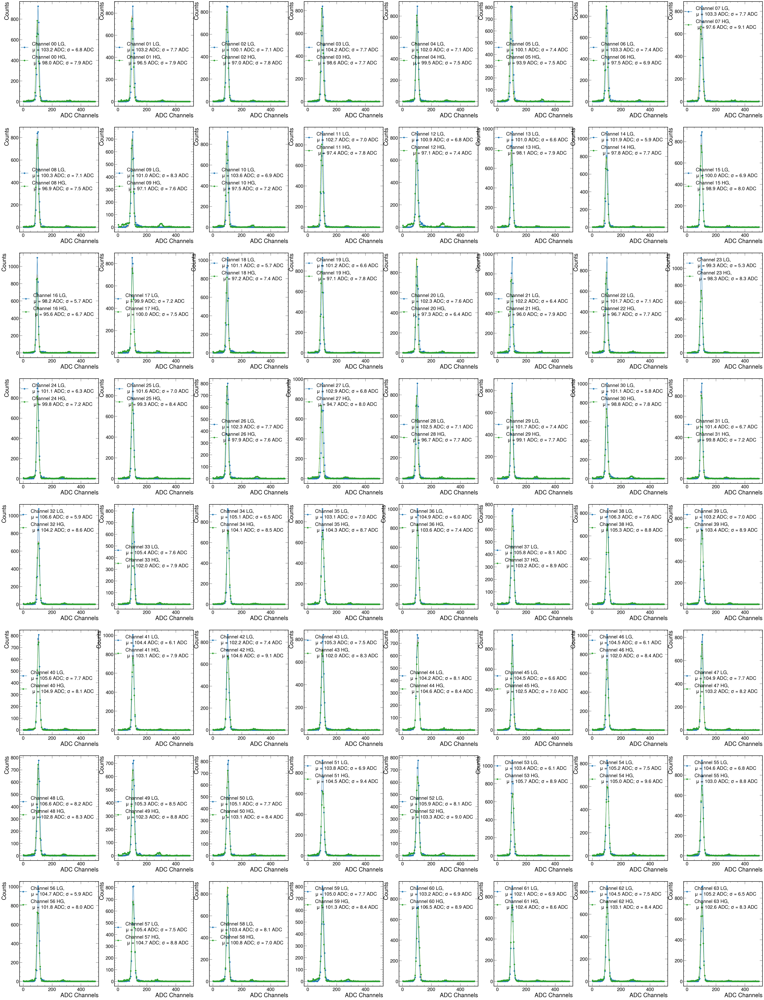

In [4]:
free_pedestal = []
free_sigma = []

fig, ax = plt.subplots(num_channels//8,8,figsize=(60,10*(num_channels//8)),sharex=False,sharey=False)
for i in range(num_channels):
    plt.sca(ax[i//8][i%8])
    board_cut = free_pedestal_df['CAEN']==0
    channel_cut = free_pedestal_df[board_cut]['channel']==i

    bins, edges = np.histogram(np.array(free_pedestal_df[board_cut][channel_cut]["LG"],dtype=int),bins=100,range=(0,500))
    centers = edges[1:]/2+edges[:-1]/2
    coeff, _ = curve_fit(gaus,centers[1:],bins[1:],p0=(1000,100,100))
    free_pedestal.append(coeff[1])
    free_sigma.append(abs(coeff[2]))
    x = np.linspace(0,200,100)
    #plt.plot(x,gaus(x,*coeff),linestyle='dashed',label='')
    plt.errorbar(centers,bins,fmt='-o',label=rf'Channel {i:02} LG,' '\n' rf'$\mu$ = {coeff[1]:.1f} ADC; $\sigma$ = {abs(coeff[2]):.1f} ADC')
    
    bins, edges = np.histogram(np.array(free_pedestal_df[board_cut][channel_cut]["HG"],dtype=int),bins=100,range=(0,500))
    centers = edges[1:]/2+edges[:-1]/2
    coeff, _ = curve_fit(gaus,centers[1:],bins[1:],p0=(1000,100,100))
    free_pedestal.append(coeff[1])
    free_sigma.append(abs(coeff[2]))
    x = np.linspace(0,200,100)
    plt.plot(x,gaus(x,*coeff),linestyle='dashed')
    plt.errorbar(centers,bins,fmt='-o',label=f'Channel {i:02} HG,' '\n' rf' $\mu$ = {coeff[1]:.1f} ADC; $\sigma$ = {abs(coeff[2]):.1f} ADC')


    plt.legend()
    plt.ylabel('Counts')
    plt.xlabel('ADC Channels')

plt.savefig('output/pedestal_free.png')
plt.show()

In [83]:
external = [[np.array([351,  28,  12,  11, 103,  61,  33,  13,   4,   4,   7,   5,   3,
           3,   2,   2,   4,   5,   1,   0,   1,   0,   2,   4,   3,   1,
           0,   1,   1,   6,   1,   1,   1,   2,   3,   5,   4,   4,   5,
           1,   5,   4,   5,   5,   2,   6,  11,   5,   6,   9,   3,   4,
           4,   7,   8,   6,   2,   4,   5,   8,   8,   5,   3,   4,   4,
           2,   6,   7,   0,  13,   3,   5,   8,   4,  12,   5,   5,   6,
           3,   6,   8,   2,   3,   6,   1,   5,   3,   4,   4,   4,   6,
           4,   2,   3,   3,   3,   5,   4,   6,   4,   3,   4,   5,   1,
           2,   0,   1,   2,   1,   5,   1,   3,   2,   2,   2,   2,   2,
           1,   8,   2,   2,   0,   2,   2,   3,   0,   1,   0,   2,   0,
           1,   0,   2,   0,   1,   0,   2,   0,   1,   0,   2,   0,   1,
           2,   1,   0,   1,   3,   2,   0,   2,   0,   1,   1,   0,   3,
           1,   0,   1,   0,   0,   3,   0,   0,   1,   1,   0,   0,   0,
           2,   0,   0,   0,   0,   0,   0,   2,   0,   0,   0,   0,   0,
           0,   0,   0,   0,   0,   0,   1,   0,   2,   1,   0,   0,   1,
           0,   0,   1,  24,   0]),
  np.array([   0.,   40.,   80.,  120.,  160.,  200.,  240.,  280.,  320.,
          360.,  400.,  440.,  480.,  520.,  560.,  600.,  640.,  680.,
          720.,  760.,  800.,  840.,  880.,  920.,  960., 1000., 1040.,
         1080., 1120., 1160., 1200., 1240., 1280., 1320., 1360., 1400.,
         1440., 1480., 1520., 1560., 1600., 1640., 1680., 1720., 1760.,
         1800., 1840., 1880., 1920., 1960., 2000., 2040., 2080., 2120.,
         2160., 2200., 2240., 2280., 2320., 2360., 2400., 2440., 2480.,
         2520., 2560., 2600., 2640., 2680., 2720., 2760., 2800., 2840.,
         2880., 2920., 2960., 3000., 3040., 3080., 3120., 3160., 3200.,
         3240., 3280., 3320., 3360., 3400., 3440., 3480., 3520., 3560.,
         3600., 3640., 3680., 3720., 3760., 3800., 3840., 3880., 3920.,
         3960., 4000., 4040., 4080., 4120., 4160., 4200., 4240., 4280.,
         4320., 4360., 4400., 4440., 4480., 4520., 4560., 4600., 4640.,
         4680., 4720., 4760., 4800., 4840., 4880., 4920., 4960., 5000.,
         5040., 5080., 5120., 5160., 5200., 5240., 5280., 5320., 5360.,
         5400., 5440., 5480., 5520., 5560., 5600., 5640., 5680., 5720.,
         5760., 5800., 5840., 5880., 5920., 5960., 6000., 6040., 6080.,
         6120., 6160., 6200., 6240., 6280., 6320., 6360., 6400., 6440.,
         6480., 6520., 6560., 6600., 6640., 6680., 6720., 6760., 6800.,
         6840., 6880., 6920., 6960., 7000., 7040., 7080., 7120., 7160.,
         7200., 7240., 7280., 7320., 7360., 7400., 7440., 7480., 7520.,
         7560., 7600., 7640., 7680., 7720., 7760., 7800., 7840., 7880.,
         7920., 7960., 8000.])],
 [np.array([778,  60,  35, 169, 109,  33,   9,  12,  17,  12,   6,   2,   5,
           4,   2,   1,   0,   3,   7,   1,   1,   5,   3,   4,   3,   1,
           2,   7,   7,   4,   5,   1,   5,   6,   5,   7,   4,  14,  12,
           5,   1,   7,  11,  14,   9,  17,  15,  12,  15,  10,  13,   8,
           9,   8,  11,  13,  16,  25,  15,  13,  16,  15,  16,  13,  11,
          16,  10,   9,   9,  10,  10,   6,   9,   5,  12,   6,  10,   8,
           6,   6,   6,   9,   5,   8,   4,   6,  10,   8,   4,   8,   8,
           4,   3,   3,   6,   3,   2,   4,   2,   1,   0,   3,   5,   3,
           4,   3,   0,   3,   2,   1,   3,   4,   0,   6,   3,   1,   3,
           0,   3,   4,   2,   0,   2,   2,   1,   3,   1,   2,   3,   1,
           1,   1,   0,   0,   0,   1,   0,   0,   1,   1,   0,   0,   0,
           1,   1,   0,   0,   0,   0,   1,   1,   0,   0,   0,   1,   0,
           0,   0,   0,   1,   2,   1,   0,   3,   0,   0,   1,   0,   0,
           0,   1,   1,   0,   0,   0,   0,   1,   1,   0,   0,   0,   0,
           1,   0,   0,   0,   0,   1,   0,   0,   0,   0,   0,   0,   0,
           0,   0,   0,   6,   0]),
  np.array([   0.,   40.,   80.,  120.,  160.,  200.,  240.,  280.,  320.,
          360.,  400.,  440.,  480.,  520.,  560.,  600.,  640.,  680.,
          720.,  760.,  800.,  840.,  880.,  920.,  960., 1000., 1040.,
         1080., 1120., 1160., 1200., 1240., 1280., 1320., 1360., 1400.,
         1440., 1480., 1520., 1560., 1600., 1640., 1680., 1720., 1760.,
         1800., 1840., 1880., 1920., 1960., 2000., 2040., 2080., 2120.,
         2160., 2200., 2240., 2280., 2320., 2360., 2400., 2440., 2480.,
         2520., 2560., 2600., 2640., 2680., 2720., 2760., 2800., 2840.,
         2880., 2920., 2960., 3000., 3040., 3080., 3120., 3160., 3200.,
         3240., 3280., 3320., 3360., 3400., 3440., 3480., 3520., 3560.,
         3600., 3640., 3680., 3720., 3760., 3800., 3840., 3880., 3920.,
         3960., 4000., 4040., 4080., 4120., 4160., 4200., 4240., 4280.,
         4320., 4360., 4400., 4440., 4480., 4520., 4560., 4600., 4640.,
         4680., 4720., 4760., 4800., 4840., 4880., 4920., 4960., 5000.,
         5040., 5080., 5120., 5160., 5200., 5240., 5280., 5320., 5360.,
         5400., 5440., 5480., 5520., 5560., 5600., 5640., 5680., 5720.,
         5760., 5800., 5840., 5880., 5920., 5960., 6000., 6040., 6080.,
         6120., 6160., 6200., 6240., 6280., 6320., 6360., 6400., 6440.,
         6480., 6520., 6560., 6600., 6640., 6680., 6720., 6760., 6800.,
         6840., 6880., 6920., 6960., 7000., 7040., 7080., 7120., 7160.,
         7200., 7240., 7280., 7320., 7360., 7400., 7440., 7480., 7520.,
         7560., 7600., 7640., 7680., 7720., 7760., 7800., 7840., 7880.,
         7920., 7960., 8000.])],
 [np.array([835,  71,  34, 204,  89,  29,  11,  10,  15,   9,   0,   3,   5,
           2,   2,   1,   2,   1,   2,   3,   4,   2,   3,   5,  12,   3,
           2,   7,  11,   3,   4,   1,   4,  10,   7,   3,   7,  11,   9,
           9,   6,  11,   8,   7,   7,   8,  10,  16,  14,  20,  12,   9,
          17,  15,  12,   9,  11,  13,  13,   5,   6,   9,  10,   8,  10,
          14,  11,   9,   8,  10,  10,   9,   5,  16,  12,   6,   5,  10,
           4,   8,   5,   6,   4,   6,   5,   0,   5,   6,   2,   5,   7,
           6,   7,   7,   7,   4,   2,   2,   3,   4,   5,   6,   2,   1,
           0,   2,   3,   3,   3,   4,   3,   1,   1,   3,   0,   2,   1,
           1,   1,   0,   0,   2,   1,   1,   0,   0,   0,   0,   2,   1,
           1,   0,   2,   2,   1,   2,   1,   2,   3,   0,   0,   1,   1,
           1,   0,   3,   0,   1,   3,   1,   1,   1,   0,   1,   1,   0,
           2,   0,   0,   1,   0,   1,   1,   0,   0,   0,   2,   0,   2,
           0,   0,   1,   0,   0,   0,   0,   0,   2,   0,   0,   0,   1,
           0,   0,   0,   1,   0,   2,   0,   0,   0,   0,   0,   0,   0,
           0,   0,  13,   0,   0]),
  np.array([   0.,   40.,   80.,  120.,  160.,  200.,  240.,  280.,  320.,
          360.,  400.,  440.,  480.,  520.,  560.,  600.,  640.,  680.,
          720.,  760.,  800.,  840.,  880.,  920.,  960., 1000., 1040.,
         1080., 1120., 1160., 1200., 1240., 1280., 1320., 1360., 1400.,
         1440., 1480., 1520., 1560., 1600., 1640., 1680., 1720., 1760.,
         1800., 1840., 1880., 1920., 1960., 2000., 2040., 2080., 2120.,
         2160., 2200., 2240., 2280., 2320., 2360., 2400., 2440., 2480.,
         2520., 2560., 2600., 2640., 2680., 2720., 2760., 2800., 2840.,
         2880., 2920., 2960., 3000., 3040., 3080., 3120., 3160., 3200.,
         3240., 3280., 3320., 3360., 3400., 3440., 3480., 3520., 3560.,
         3600., 3640., 3680., 3720., 3760., 3800., 3840., 3880., 3920.,
         3960., 4000., 4040., 4080., 4120., 4160., 4200., 4240., 4280.,
         4320., 4360., 4400., 4440., 4480., 4520., 4560., 4600., 4640.,
         4680., 4720., 4760., 4800., 4840., 4880., 4920., 4960., 5000.,
         5040., 5080., 5120., 5160., 5200., 5240., 5280., 5320., 5360.,
         5400., 5440., 5480., 5520., 5560., 5600., 5640., 5680., 5720.,
         5760., 5800., 5840., 5880., 5920., 5960., 6000., 6040., 6080.,
         6120., 6160., 6200., 6240., 6280., 6320., 6360., 6400., 6440.,
         6480., 6520., 6560., 6600., 6640., 6680., 6720., 6760., 6800.,
         6840., 6880., 6920., 6960., 7000., 7040., 7080., 7120., 7160.,
         7200., 7240., 7280., 7320., 7360., 7400., 7440., 7480., 7520.,
         7560., 7600., 7640., 7680., 7720., 7760., 7800., 7840., 7880.,
         7920., 7960., 8000.])],
 [np.array([448,  35,  15,  19,  85,  58,  23,   7,   3,   6,  15,   4,   3,
           1,   4,   1,   3,   4,   1,   0,   3,   2,   2,   4,   1,   0,
           2,   0,   2,   4,   1,   3,   2,   0,   7,   5,   4,   3,   2,
           1,   8,   8,   5,   5,   5,   4,  10,   8,   4,   7,   5,   8,
           6,   6,  11,   8,   4,  10,   7,  12,  11,   5,   8,  13,  11,
          11,  12,   6,   7,  11,  14,  10,  11,  12,  12,   6,  11,   9,
          10,   6,   9,   8,   9,   8,   7,   5,   7,   7,   9,   7,   8,
           8,   7,   7,   5,   5,   6,   5,   3,   8,   2,   7,   3,   7,
           5,   4,   4,   5,   5,   3,   4,   1,   4,   2,   4,   9,   6,
           5,   1,   4,   2,   1,   2,   3,   1,   4,   0,   1,   3,   3,
           1,   1,   3,   1,   0,   3,   4,   1,   2,   4,   2,   4,   2,
           2,   1,   2,   4,   1,   3,   1,   1,   1,   2,   0,   2,   1,
           1,   1,   1,   2,   1,   1,   1,   0,   1,   0,   0,   1,   1,
           3,   1,   4,   1,   0,   0,   0,   0,   0,   1,   0,   0,   0,
           1,   0,   0,   0,   0,   2,   0,   1,   0,   1,   1,   0,   0,
           0,   0,   0,  28,   0]),
  np.array([   0.,   40.,   80.,  120.,  160.,  200.,  240.,  280.,  320.,
          360.,  400.,  440.,  480.,  520.,  560.,  600.,  640.,  680.,
          720.,  760.,  800.,  840.,  880.,  920.,  960., 1000., 1040.,
         1080., 1120., 1160., 1200., 1240., 1280., 1320., 1360., 1400.,
         1440., 1480., 1520., 1560., 1600., 1640., 1680., 1720., 1760.,
         1800., 1840., 1880., 1920., 1960., 2000., 2040., 2080., 2120.,
         2160., 2200., 2240., 2280., 2320., 2360., 2400., 2440., 2480.,
         2520., 2560., 2600., 2640., 2680., 2720., 2760., 2800., 2840.,
         2880., 2920., 2960., 3000., 3040., 3080., 3120., 3160., 3200.,
         3240., 3280., 3320., 3360., 3400., 3440., 3480., 3520., 3560.,
         3600., 3640., 3680., 3720., 3760., 3800., 3840., 3880., 3920.,
         3960., 4000., 4040., 4080., 4120., 4160., 4200., 4240., 4280.,
         4320., 4360., 4400., 4440., 4480., 4520., 4560., 4600., 4640.,
         4680., 4720., 4760., 4800., 4840., 4880., 4920., 4960., 5000.,
         5040., 5080., 5120., 5160., 5200., 5240., 5280., 5320., 5360.,
         5400., 5440., 5480., 5520., 5560., 5600., 5640., 5680., 5720.,
         5760., 5800., 5840., 5880., 5920., 5960., 6000., 6040., 6080.,
         6120., 6160., 6200., 6240., 6280., 6320., 6360., 6400., 6440.,
         6480., 6520., 6560., 6600., 6640., 6680., 6720., 6760., 6800.,
         6840., 6880., 6920., 6960., 7000., 7040., 7080., 7120., 7160.,
         7200., 7240., 7280., 7320., 7360., 7400., 7440., 7480., 7520.,
         7560., 7600., 7640., 7680., 7720., 7760., 7800., 7840., 7880.,
         7920., 7960., 8000.])],
 [np.array([1173,   62,   25,  128,   67,   25,    6,    3,   20,    9,    4,
            0,    4,    6,    1,    5,    0,    4,    4,    1,    1,    0,
            7,    3,    2,    7,    2,    8,    7,    4,    4,    7,   12,
           12,    7,    7,   15,   14,    9,    6,   14,   13,   17,   12,
            4,   10,   19,   18,   13,    8,   11,   15,   14,   10,    7,
            8,   17,    8,   10,   14,   17,   13,    9,    8,    5,   12,
           11,   10,    9,   12,   17,    6,    7,    8,    5,    9,   10,
            5,    6,   13,    8,    6,    4,    5,    3,    6,    1,    2,
            2,    5,    3,    2,    1,    1,    4,    5,    5,    2,    3,
            4,    5,    7,    3,    5,    4,    3,    2,    6,    2,    1,
            2,    1,    2,    2,    0,    0,    2,    2,    1,    3,    1,
            6,    1,    3,    0,    0,    1,    0,    1,    1,    2,    1,
            0,    3,    1,    1,    0,    0,    1,    0,    3,    2,    1,
            1,    1,    1,    1,    0,    2,    0,    0,    0,    0,    0,
            0,    0,    2,    0,    3,    1,    0,    1,    1,    0,    2,
            0,    0,    1,    0,    0,    0,    1,    1,    1,    0,    1,
            1,    1,    1,    1,    0,    0,    0,    0,    1,    1,    0,
            1,    1,    0,    0,    0,    0,    0,    0,    0,    2,    1,
            0,   12]),
  np.array([   0.,   40.,   80.,  120.,  160.,  200.,  240.,  280.,  320.,
          360.,  400.,  440.,  480.,  520.,  560.,  600.,  640.,  680.,
          720.,  760.,  800.,  840.,  880.,  920.,  960., 1000., 1040.,
         1080., 1120., 1160., 1200., 1240., 1280., 1320., 1360., 1400.,
         1440., 1480., 1520., 1560., 1600., 1640., 1680., 1720., 1760.,
         1800., 1840., 1880., 1920., 1960., 2000., 2040., 2080., 2120.,
         2160., 2200., 2240., 2280., 2320., 2360., 2400., 2440., 2480.,
         2520., 2560., 2600., 2640., 2680., 2720., 2760., 2800., 2840.,
         2880., 2920., 2960., 3000., 3040., 3080., 3120., 3160., 3200.,
         3240., 3280., 3320., 3360., 3400., 3440., 3480., 3520., 3560.,
         3600., 3640., 3680., 3720., 3760., 3800., 3840., 3880., 3920.,
         3960., 4000., 4040., 4080., 4120., 4160., 4200., 4240., 4280.,
         4320., 4360., 4400., 4440., 4480., 4520., 4560., 4600., 4640.,
         4680., 4720., 4760., 4800., 4840., 4880., 4920., 4960., 5000.,
         5040., 5080., 5120., 5160., 5200., 5240., 5280., 5320., 5360.,
         5400., 5440., 5480., 5520., 5560., 5600., 5640., 5680., 5720.,
         5760., 5800., 5840., 5880., 5920., 5960., 6000., 6040., 6080.,
         6120., 6160., 6200., 6240., 6280., 6320., 6360., 6400., 6440.,
         6480., 6520., 6560., 6600., 6640., 6680., 6720., 6760., 6800.,
         6840., 6880., 6920., 6960., 7000., 7040., 7080., 7120., 7160.,
         7200., 7240., 7280., 7320., 7360., 7400., 7440., 7480., 7520.,
         7560., 7600., 7640., 7680., 7720., 7760., 7800., 7840., 7880.,
         7920., 7960., 8000.])],
 [np.array([632,  64,  24,  40, 136,  36,  14,   6,   8,  18,  15,   6,   2,
           2,   5,   7,  12,   2,   3,   2,  10,   8,   5,   5,   6,   5,
          17,  16,   7,   6,   8,  12,  15,  16,  14,   2,   9,  16,  14,
          14,  14,  12,   9,  20,  14,  14,   9,   9,  17,   7,  12,  14,
          10,  13,  11,  10,  11,   8,   7,   6,   8,  11,  11,  15,   8,
           5,   8,   5,   6,  11,   5,   6,  10,   3,   3,   4,   3,   5,
           5,   4,   4,   7,   3,   4,   2,   2,   4,   4,   6,   2,   0,
           3,   1,   6,   1,   5,   2,   0,   4,   3,   3,   2,   4,   0,
           4,   0,   2,   2,   5,   1,   0,   0,   2,   3,   3,   1,   3,
           2,   0,   1,   0,   2,   0,   0,   0,   1,   1,   2,   2,   0,
           0,   1,   1,   0,   0,   0,   2,   0,   0,   0,   3,   0,   0,
           2,   0,   0,   0,   0,   0,   0,   1,   0,   0,   0,   0,   0,
           0,   0,   0,   1,   0,   0,   1,   0,   1,   1,   2,   0,   0,
           0,   0,   1,   0,   0,   0,   1,   0,   0,   2,   1,   0,   0,
           0,   1,   1,   0,   1,   0,   1,   0,   1,   0,   0,   0,   0,
           0,   0,   0,   6,   0]),
  np.array([   0.,   40.,   80.,  120.,  160.,  200.,  240.,  280.,  320.,
          360.,  400.,  440.,  480.,  520.,  560.,  600.,  640.,  680.,
          720.,  760.,  800.,  840.,  880.,  920.,  960., 1000., 1040.,
         1080., 1120., 1160., 1200., 1240., 1280., 1320., 1360., 1400.,
         1440., 1480., 1520., 1560., 1600., 1640., 1680., 1720., 1760.,
         1800., 1840., 1880., 1920., 1960., 2000., 2040., 2080., 2120.,
         2160., 2200., 2240., 2280., 2320., 2360., 2400., 2440., 2480.,
         2520., 2560., 2600., 2640., 2680., 2720., 2760., 2800., 2840.,
         2880., 2920., 2960., 3000., 3040., 3080., 3120., 3160., 3200.,
         3240., 3280., 3320., 3360., 3400., 3440., 3480., 3520., 3560.,
         3600., 3640., 3680., 3720., 3760., 3800., 3840., 3880., 3920.,
         3960., 4000., 4040., 4080., 4120., 4160., 4200., 4240., 4280.,
         4320., 4360., 4400., 4440., 4480., 4520., 4560., 4600., 4640.,
         4680., 4720., 4760., 4800., 4840., 4880., 4920., 4960., 5000.,
         5040., 5080., 5120., 5160., 5200., 5240., 5280., 5320., 5360.,
         5400., 5440., 5480., 5520., 5560., 5600., 5640., 5680., 5720.,
         5760., 5800., 5840., 5880., 5920., 5960., 6000., 6040., 6080.,
         6120., 6160., 6200., 6240., 6280., 6320., 6360., 6400., 6440.,
         6480., 6520., 6560., 6600., 6640., 6680., 6720., 6760., 6800.,
         6840., 6880., 6920., 6960., 7000., 7040., 7080., 7120., 7160.,
         7200., 7240., 7280., 7320., 7360., 7400., 7440., 7480., 7520.,
         7560., 7600., 7640., 7680., 7720., 7760., 7800., 7840., 7880.,
         7920., 7960., 8000.])],
 [np.array([921,  60,  35, 141,  72,  23,  11,   8,  16,  10,   1,   3,   2,
           4,   4,   5,   1,   5,  10,   2,   4,   2,   8,   8,  11,   6,
           4,  10,  15,   9,   7,   6,  10,  16,  21,  24,   9,  11,  14,
          10,   6,  14,   8,  10,  19,  15,  11,  13,  13,  13,   6,   6,
           9,  14,  13,  12,  10,  11,  16,  11,  14,   8,   7,   9,   7,
          11,   5,   4,  11,   9,   5,   7,   9,   9,  10,   6,   5,   6,
           4,   6,   3,   4,   5,   4,   1,   3,   1,   3,   5,   4,   4,
           3,   1,   4,   3,   3,   1,   0,   4,   1,   0,   0,   4,   1,
           2,   3,   0,   1,   2,   1,   1,   0,   1,   0,   2,   1,   0,
           0,   0,   1,   1,   1,   0,   0,   1,   0,   0,   2,   1,   0,
           0,   0,   1,   0,   0,   0,   0,   1,   2,   0,   1,   1,   0,
           0,   0,   0,   1,   0,   3,   0,   0,   2,   0,   1,   0,   0,
           0,   1,   0,   0,   1,   0,   1,   0,   1,   0,   0,   0,   0,
           0,   0,   0,   0,   0,   1,   0,   0,   0,   0,   0,   0,   1,
           0,   1,   2,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           1,   0,   0,   0,   8]),
  np.array([   0.,   40.,   80.,  120.,  160.,  200.,  240.,  280.,  320.,
          360.,  400.,  440.,  480.,  520.,  560.,  600.,  640.,  680.,
          720.,  760.,  800.,  840.,  880.,  920.,  960., 1000., 1040.,
         1080., 1120., 1160., 1200., 1240., 1280., 1320., 1360., 1400.,
         1440., 1480., 1520., 1560., 1600., 1640., 1680., 1720., 1760.,
         1800., 1840., 1880., 1920., 1960., 2000., 2040., 2080., 2120.,
         2160., 2200., 2240., 2280., 2320., 2360., 2400., 2440., 2480.,
         2520., 2560., 2600., 2640., 2680., 2720., 2760., 2800., 2840.,
         2880., 2920., 2960., 3000., 3040., 3080., 3120., 3160., 3200.,
         3240., 3280., 3320., 3360., 3400., 3440., 3480., 3520., 3560.,
         3600., 3640., 3680., 3720., 3760., 3800., 3840., 3880., 3920.,
         3960., 4000., 4040., 4080., 4120., 4160., 4200., 4240., 4280.,
         4320., 4360., 4400., 4440., 4480., 4520., 4560., 4600., 4640.,
         4680., 4720., 4760., 4800., 4840., 4880., 4920., 4960., 5000.,
         5040., 5080., 5120., 5160., 5200., 5240., 5280., 5320., 5360.,
         5400., 5440., 5480., 5520., 5560., 5600., 5640., 5680., 5720.,
         5760., 5800., 5840., 5880., 5920., 5960., 6000., 6040., 6080.,
         6120., 6160., 6200., 6240., 6280., 6320., 6360., 6400., 6440.,
         6480., 6520., 6560., 6600., 6640., 6680., 6720., 6760., 6800.,
         6840., 6880., 6920., 6960., 7000., 7040., 7080., 7120., 7160.,
         7200., 7240., 7280., 7320., 7360., 7400., 7440., 7480., 7520.,
         7560., 7600., 7640., 7680., 7720., 7760., 7800., 7840., 7880.,
         7920., 7960., 8000.])],
 [np.array([861,  70,  47, 169,  73,  18,   8,  14,  21,  10,   1,   4,   5,
           5,   2,   3,   0,   8,   8,   4,   1,   2,   8,   7,   1,   4,
           7,  10,   9,   5,   5,   8,  16,  13,   9,   6,   8,   6,  14,
           9,   8,   3,   8,  13,   4,  10,   9,  10,  11,   7,   7,  10,
           4,   2,   7,   7,   7,   4,   4,   9,   4,   6,   6,   9,   5,
           2,   2,   5,   4,   3,   2,   2,   2,   3,   3,   5,   3,   3,
           2,   3,   3,   3,   5,   4,   2,   2,   1,   2,   2,   3,   4,
           2,   1,   1,   2,   2,   0,   1,   2,   0,   0,   1,   0,   1,
           1,   1,   0,   0,   0,   4,   1,   1,   0,   0,   0,   2,   0,
           1,   0,   2,   0,   0,   1,   1,   1,   0,   0,   0,   0,   1,
           1,   0,   0,   0,   0,   1,   0,   0,   1,   0,   0,   0,   0,
           1,   0,   1,   0,   0,   0,   1,   0,   0,   0,   0,   0,   0,
           0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,
           1,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   0,   1,
           0,   0,   0,   0,   1,   1,   0,   0,   0,   0,   0,   0,   0,
           0,   1,   3,   0,   0]),
  np.array([   0.,   40.,   80.,  120.,  160.,  200.,  240.,  280.,  320.,
          360.,  400.,  440.,  480.,  520.,  560.,  600.,  640.,  680.,
          720.,  760.,  800.,  840.,  880.,  920.,  960., 1000., 1040.,
         1080., 1120., 1160., 1200., 1240., 1280., 1320., 1360., 1400.,
         1440., 1480., 1520., 1560., 1600., 1640., 1680., 1720., 1760.,
         1800., 1840., 1880., 1920., 1960., 2000., 2040., 2080., 2120.,
         2160., 2200., 2240., 2280., 2320., 2360., 2400., 2440., 2480.,
         2520., 2560., 2600., 2640., 2680., 2720., 2760., 2800., 2840.,
         2880., 2920., 2960., 3000., 3040., 3080., 3120., 3160., 3200.,
         3240., 3280., 3320., 3360., 3400., 3440., 3480., 3520., 3560.,
         3600., 3640., 3680., 3720., 3760., 3800., 3840., 3880., 3920.,
         3960., 4000., 4040., 4080., 4120., 4160., 4200., 4240., 4280.,
         4320., 4360., 4400., 4440., 4480., 4520., 4560., 4600., 4640.,
         4680., 4720., 4760., 4800., 4840., 4880., 4920., 4960., 5000.,
         5040., 5080., 5120., 5160., 5200., 5240., 5280., 5320., 5360.,
         5400., 5440., 5480., 5520., 5560., 5600., 5640., 5680., 5720.,
         5760., 5800., 5840., 5880., 5920., 5960., 6000., 6040., 6080.,
         6120., 6160., 6200., 6240., 6280., 6320., 6360., 6400., 6440.,
         6480., 6520., 6560., 6600., 6640., 6680., 6720., 6760., 6800.,
         6840., 6880., 6920., 6960., 7000., 7040., 7080., 7120., 7160.,
         7200., 7240., 7280., 7320., 7360., 7400., 7440., 7480., 7520.,
         7560., 7600., 7640., 7680., 7720., 7760., 7800., 7840., 7880.,
         7920., 7960., 8000.])]]


/tmp/ipykernel_3637384/3918201542.py:14: RuntimeWarning:

divide by zero encountered in divide



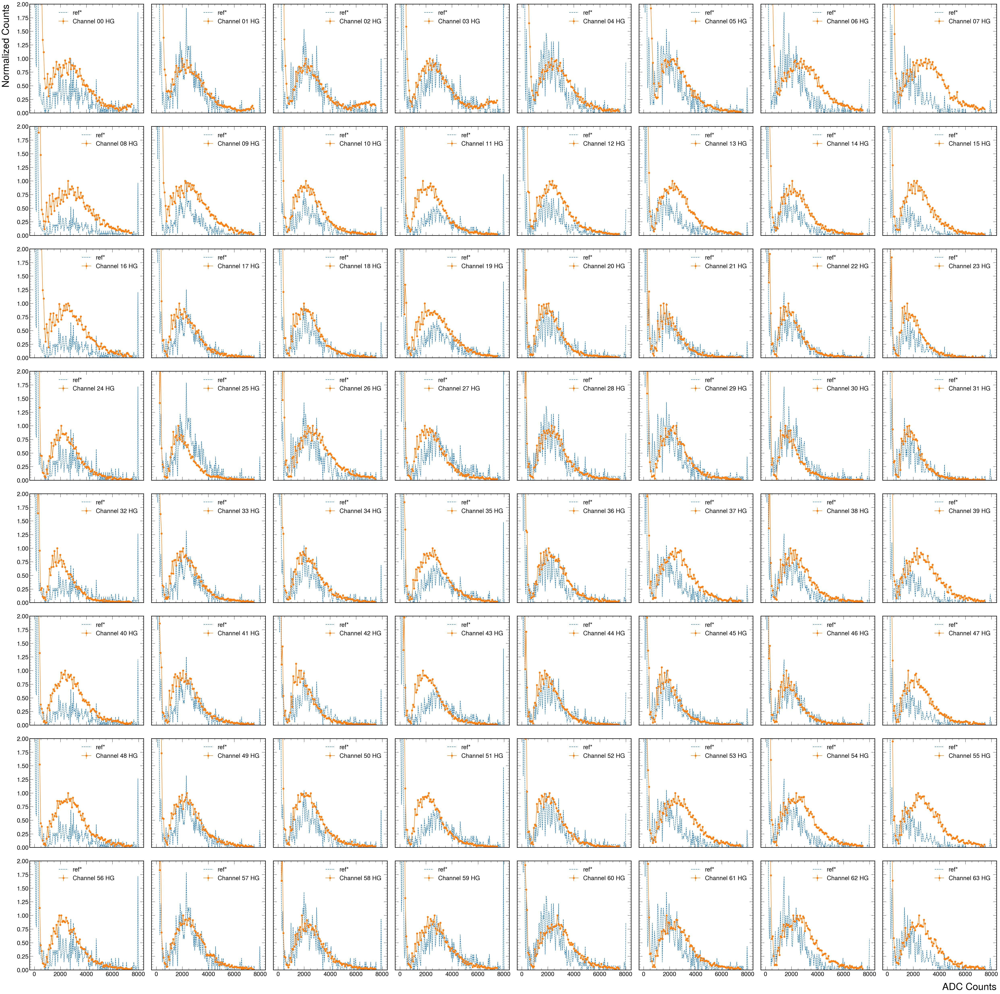

In [91]:
fig, ax = plt.subplots(num_channels//8,8,figsize=(50,50),sharex=True,sharey=True)
data_hg = []
data_e = []
for i in range(num_channels):
    plt.sca(ax[i//8][i%8])
    board_cut = free_cosmic_df['CAEN']==0
    channel_cut = free_cosmic_df[board_cut]['channel']==i

    bins, edges = np.histogram(np.array(free_cosmic_df[board_cut][channel_cut]["HG"],dtype=int)-free_pedestal[i*2+1]-3*free_sigma[i*2+1],bins=100,range=(0,7500),density=True)
    centers = edges[1:]/2+edges[:-1]/2
    
    plt.ylim(0,2)
    try:
        coeff, _ = curve_fit(gaus,centers[11:],bins[11:],p0=(8.39387137e-05, 3.17774273e+03, 1.51544717e+03),sigma=1/bins[11:])
        x = np.linspace(0,6000,100)
        hg = np.array(free_cosmic_df[board_cut][channel_cut]["HG"],dtype=int)-free_pedestal[i*2+1]-3*free_sigma[i*2+1]
        data_hg.append(coeff[1])
        data_e.append(abs(coeff[2]))

    except: 
        data_hg.append(999999)
        data_e.append(999999)
        pass
        
    plt.errorbar(external[i%8][1][1:],external[i%8][0]/max(external[i//8][0][np.array(external[i%8][1][1:])>1500][:-20]),fmt='--',label='ref*')
    plt.errorbar(centers,bins/max(bins[20:]),yerr=np.sqrt(bins),fmt='-o',label=f'Channel {i:02} HG')
    #plt.xlim(0,5)
    plt.legend()

    
ax[0, 0].set_ylabel('Normalized Counts', fontsize=35, labelpad=20)
ax[-1, -1].set_xlabel('ADC Counts', fontsize=35, labelpad=20)
    
plt.tight_layout()
plt.savefig('output/mip_free.png')
plt.show()

In [6]:
dg = {}
for i in range(num_channels):
    dg[f'{i:02}'] = []
    dg[f'{i:02}'] = free_cosmic_df.loc[free_cosmic_df["channel"] == i, "HG"].to_numpy()

In [7]:
cuts = np.array(data_hg)*0.3

In [8]:
dd = pd.DataFrame(dg)>cuts

In [9]:
with open('data/2x4_planar_25mm_offset_25_8cm_separation.pkl', 'rb') as h:
    dg =  pd.DataFrame(pd.DataFrame(pickle.load(h)))

In [10]:
xyz_board_list = get_xyz_board_mapping_fast(dd, dg)
data_angle_xy_free = []
data_angle_free = []
data_angle_free_hits = []
for i in range(len(xyz_board_list)):
    xx = np.array(xyz_board_list[i][:,1],dtype=float)
    yy = np.array(xyz_board_list[i][:,2],dtype=float)
    zz = np.array(xyz_board_list[i][:,3],dtype=float)
    xx = xx[~np.isnan(xx)]
    yy = yy[~np.isnan(yy)]
    zz = zz[~np.isnan(zz)]
    if len(set(zz))==1: continue
    data_angle_free_hits.append(len(zz))
    data_angle_free.append(vector_angle_reconstruct(xx, yy, zz))
    data_angle_xy_free.append(theta_x_y(xx, yy, zz))
    

/tmp/ipykernel_3637384/2409019607.py:29: RuntimeWarning: invalid value encountered in scalar divide
  return x/z
/tmp/ipykernel_3637384/2409019607.py:32: RuntimeWarning: divide by zero encountered in scalar divide
  return y/z
/tmp/ipykernel_3637384/2409019607.py:29: RuntimeWarning: divide by zero encountered in scalar divide
  return x/z
/tmp/ipykernel_3637384/2409019607.py:38: RuntimeWarning: Mean of empty slice.
  datamean = data.mean(axis=0)
/home/jiajun/miniconda3/envs/tensorflow/lib/python3.8/site-packages/numpy/core/_methods.py:184: RuntimeWarning: invalid value encountered in divide
  ret = um.true_divide(
/tmp/ipykernel_3637384/2409019607.py:58: RuntimeWarning: Mean of empty slice.
  datamean = data.mean(axis=0)
/tmp/ipykernel_3637384/2409019607.py:32: RuntimeWarning: invalid value encountered in scalar divide
  return y/z


In [71]:
#output_file = free_file.replace(".root", ".pkl")
path = '/home/jiajun/github/muography/data/planar_rotated_freesky/'
files = sorted(os.listdir(path))

In [72]:
for config in ['free']:

    batches = pd.DataFrame()
    output_file = f'{config}_merge.pkl'
    for file in files:
        if 'merge' in file: continue
        if config not in file: continue
    
        with ur.open(path+file+":events") as f:
            arrays = f.arrays(filter_name=["MuographyHits.energy", "MuographyHitsContributions.time", 
                                           "MuographyHits.position.x", "MuographyHits.position.y", "MuographyHits.position.z", 
                                           "MCParticles.PDG", "MCParticles.generatorStatus", 
                                           "MCParticles.momentum.x", "MCParticles.momentum.y", "MCParticles.momentum.z", 
                                           "MCParticles.vertex.x", "MCParticles.vertex.y", "MCParticles.vertex.z", 
                                           "MCParticles.mass"])
            
        y,x=np.histogram(ak.flatten(arrays["MuographyHits.energy"]), bins=100, range=(0, 0.004))
        bc=(x[1:]+x[:-1])/2
        MIP=list(bc[y==max(y[3:])])[0] 
        plt.errorbar(np.array(bc)*1000,np.array(y),yerr=np.sqrt(y))
        plt.axvline(0.3*MIP*1000,label=f'MIP = {MIP*1000:.2f} MeV')
        plt.xlabel('Cell Energy (MeV)')
        plt.legend()
        plt.close()
        
        data_energy = arrays[f'MuographyHits.energy']
        
        sigma = 0.28
        
        # flatten to numpy
        flat = ak.to_numpy(data_energy.layout.content)
        noise = np.random.normal(0, sigma, size=len(flat))*MIP
        
        # add noise
        flat_smear = np.clip(flat + noise, a_min=1e-16, a_max=None)
        
        offsets = ak.to_numpy(data_energy.layout.offsets)  # convert Index64 → numpy
        lengths = offsets[1:] - offsets[:-1]
        data_energy_smear = ak.unflatten(flat_smear, lengths)
        
        data_MIP_cut = data_energy_smear > 0.3*MIP
        data_cell_cut = ak.num(data_energy_smear[data_MIP_cut], axis=1) >= 2
        
        data_energy = data_energy[data_cell_cut]
        data_energy_smear = data_energy_smear[data_cell_cut]
        data_x = arrays[f'MuographyHits.position.x'][data_cell_cut]
        data_y = arrays[f'MuographyHits.position.y'][data_cell_cut]
        data_z = arrays[f'MuographyHits.position.z'][data_cell_cut]    
        reco_data_angle = np.array([vector_angle_reconstruct(np.array(xi,dtype=float), np.array(yi,dtype=float), np.array(zi,dtype=float)) for xi, yi, zi in zip(data_x,data_y,data_z)])
        reco_data_angle_1 = np.array([theta_x_y(np.array(xi,dtype=float)/10, np.array(yi,dtype=float)/10, np.array(zi,dtype=float)/10) for xi, yi, zi in zip(data_x,data_y,data_z)])
        
        data_theta = ak.Array(reco_data_angle[:,0])
        data_phi = ak.Array(reco_data_angle[:,1])
        data_time = arrays[f'MuographyHitsContributions.time'][data_cell_cut]
        status = arrays["MCParticles.generatorStatus"]
        mc_px = arrays["MCParticles.momentum.x"][status==1][data_cell_cut]
        mc_py = arrays["MCParticles.momentum.y"][status==1][data_cell_cut]
        mc_pz = arrays["MCParticles.momentum.z"][status==1][data_cell_cut]
        mc_x = arrays["MCParticles.vertex.x"][status==1][data_cell_cut]
        mc_y = arrays["MCParticles.vertex.y"][status==1][data_cell_cut]
        mc_z = arrays["MCParticles.vertex.z"][status==1][data_cell_cut]
        mc_theta = theta_reconstruct(mc_px,mc_py,mc_pz)
        mc_phi = phi_reconstruct(mc_px,mc_py,mc_pz)
        mc_PDG = arrays["MCParticles.PDG"][status==1][data_cell_cut]
        mc_mass = arrays["MCParticles.mass"][status==1][data_cell_cut]
        status = status[status==1][data_cell_cut]
        detector = np.full(len(status), file.split('.edm4hep.root')[0].split('_')[-1], dtype=np.int32) #file.split('.edm4hep.root')[0].split('_')[-1]
        data_energy_sum = np.sum(data_energy_smear,axis=1)
        
        H, xedges, yedges = np.histogram2d(
            np.array(np.concatenate(mc_theta)),
            np.array(data_energy_sum),
            bins=(200, np.linspace(0,15/1000,200))
        )
        
        X, Y = np.meshgrid(xedges, yedges)
        
        # plt.pcolormesh(X, Y, H.T, cmap="copper")
        # plt.colorbar(label='Counts')
        # plt.xlabel("MC Theta (degrees)")
        # plt.ylabel('Sum Event Energy (MeV)')
        #plt.yscale('log')
        
        
        peak_indices = np.argmax(H, axis=1)
        theta_centers = 0.5 * (xedges[:-1] + xedges[1:])
        energy_centers = 0.5 * (yedges[:-1] + yedges[1:])
        E_peaks = energy_centers[peak_indices]
        def exp_decay(theta, A, k, C):
            return A * np.exp(k * theta) + C
        # Remove NaNs or weird edges
        mask = np.isfinite(E_peaks)
        theta_fit = theta_centers[mask]
        E_fit = E_peaks[mask]
        
        # popt, pcov = curve_fit(exp_decay, theta_fit, E_fit, p0=(0.001, 0.05, 0.001))
        # A, k, C = popt
        # #print("Fit parameters: A=%.3f, k=%.3f, C=%.3f" % (A, k, C))
        # theta_smooth = np.linspace(theta_fit.min(), theta_fit.max(), 300)
        # plt.plot(theta_smooth, exp_decay(theta_smooth, *popt), '--', lw=2, label="Exp Fit: A=%.3f, B=%.3f, C=%.3f" % (A, k, C))
        # legend = plt.legend(facecolor="black", edgecolor="white")
        # for text in legend.get_texts():
        #     text.set_color("white")
        # def theta_from_energy(E, A, k, C):
        #     return (1.0 / k) * np.log((E - C) / A)
        # plt.close()
        
        # data_theta_engergy = theta_from_energy(np.array(data_energy_sum),*popt)
            
        branches = {
            "detector": ak.Array(detector),
            "theta_reco": ak.Array(data_theta),
            "phi_reco": ak.Array(data_phi),
            "theta_true": ak.Array(ak.flatten(mc_theta)),
            "phi_true": ak.Array(ak.flatten(mc_phi)),
            "event_energy": ak.Array(data_energy_sum),
            "theta_reco_x": ak.Array(ak.Array(reco_data_angle_1[:,0])),
            "theta_reco_y": ak.Array(ak.Array(reco_data_angle_1[:,1]))
            #"theta_energy": ak.Array(data_theta_engergy)
        }   
        batch = pd.DataFrame(branches)
        
        batches = pd.concat([batches, batch], ignore_index=True)
        
        num = 10000
        i = 0
        for i in range(int(len(mc_theta)/num)):
            if len(mc_theta) < num: continue
            print(f"Processing {file}: {i}/{int(len(mc_theta)/num)-1}", end='\r',flush=True)
            branches = {
                "MuographyHits.position.x": data_x[i*num:(i+1)*num],
                "MuographyHits.position.y": data_y[i*num:(i+1)*num],
                "MuographyHits.position.z": data_z[i*num:(i+1)*num],
                "MuographyHits.time": data_time[i*num:(i+1)*num],
                "MuographyHits.energy_nonsmear": data_energy[i*num:(i+1)*num],
                "MuographyHits.energy": data_energy_smear[i*num:(i+1)*num],
                "MCParticles.generatorStatus": status[i*num:(i+1)*num],
                "MCParticles.PDG": mc_PDG[i*num:(i+1)*num],
                "MCParticles.mass": mc_mass[i*num:(i+1)*num],
                "MCParticles.momentum.x": mc_px[i*num:(i+1)*num],
                "MCParticles.momentum.y": mc_py[i*num:(i+1)*num],
                "MCParticles.momentum.z": mc_pz[i*num:(i+1)*num]
            }
            with ur.recreate(path+f'split/{file}_{i:03d}.root') as fout:
                fout["events"] = branches
        if len(mc_theta)%10000 != 0:
            if len(mc_theta) < num: i -= 1
            print(f"Processing {file}: {i+1}/{int(len(mc_theta)/num)}", end='\r',flush=True)
            branches = {
                "MuographyHits.position.x": data_x[(i+1)*num:len(mc_theta)],
                "MuographyHits.position.y": data_y[(i+1)*num:len(mc_theta)],
                "MuographyHits.position.z": data_z[(i+1)*num:len(mc_theta)],
                "MuographyHits.time": data_time[(i+1)*num:len(mc_theta)],
                "MuographyHits.energy_nonsmear": data_energy[(i+1)*num:len(mc_theta)],
                "MuographyHits.energy": data_energy_smear[(i+1)*num:len(mc_theta)],
                "MCParticles.generatorStatus": status[(i+1)*num:len(mc_theta)],
                "MCParticles.PDG": mc_PDG[(i+1)*num:len(mc_theta)],
                "MCParticles.mass": mc_mass[(i+1)*num:len(mc_theta)],
                "MCParticles.momentum.x": mc_px[(i+1)*num:len(mc_theta)],
                "MCParticles.momentum.y": mc_py[(i+1)*num:len(mc_theta)],
                "MCParticles.momentum.z": mc_pz[(i+1)*num:len(mc_theta)]
            }
        
            with ur.recreate(path+f'split/{file}_{i+1:03d}.root') as fout:
                fout["events"] = branches
        
        
        
    with open(path+output_file, "wb") as fout:
        pickle.dump(batches, fout)
    print('/nDone' + f'for {config}' + '/n')

/tmp/ipykernel_3637384/2409019607.py:29: RuntimeWarning:

divide by zero encountered in scalar divide

/tmp/ipykernel_3637384/2409019607.py:32: RuntimeWarning:

invalid value encountered in scalar divide

/tmp/ipykernel_3637384/2409019607.py:29: RuntimeWarning:

invalid value encountered in scalar divide

/tmp/ipykernel_3637384/2409019607.py:32: RuntimeWarning:

divide by zero encountered in scalar divide



/nDonefor free/nr_rotated_freesky_free_0.edm4hep.root: 1/1


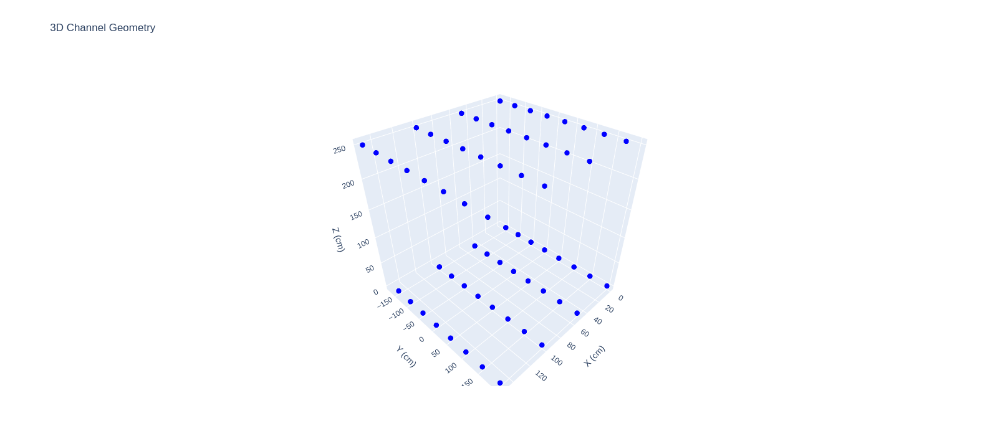

In [73]:
import plotly.graph_objects as go
import numpy as np

# Convert lists to numpy arrays
X = np.concatenate(data_x)
Y = np.concatenate(data_y)
Z = np.concatenate(data_z)

fig = go.Figure()

# Scatter points
fig.add_trace(go.Scatter3d(
    x=X,
    y=Y,
    z=Z,
    mode='markers+text',
    marker=dict(
        size=5,
        color='blue',
        opacity=0.8
    ),
    textposition="top center"
))

fig.update_layout(
    title="3D Channel Geometry",
    scene=dict(
        xaxis_title='X (cm)',
        yaxis_title='Y (cm)',
        zaxis_title='Z (cm)',
        aspectmode='data'
    ),
    width=900,
    height=700
)

fig.update_layout(
    title="3D Channel Geometry",
    scene=dict(
        xaxis=dict(title='X (cm)'),
        yaxis=dict(title='Y (cm)'),
        zaxis=dict(title='Z (cm)'),
        aspectmode='cube'   # force equal 20×20×20 box
    ),
    width=900,
    height=700
)

fig.show()


/tmp/ipykernel_3637384/3888403387.py:14: RuntimeWarning:

divide by zero encountered in divide



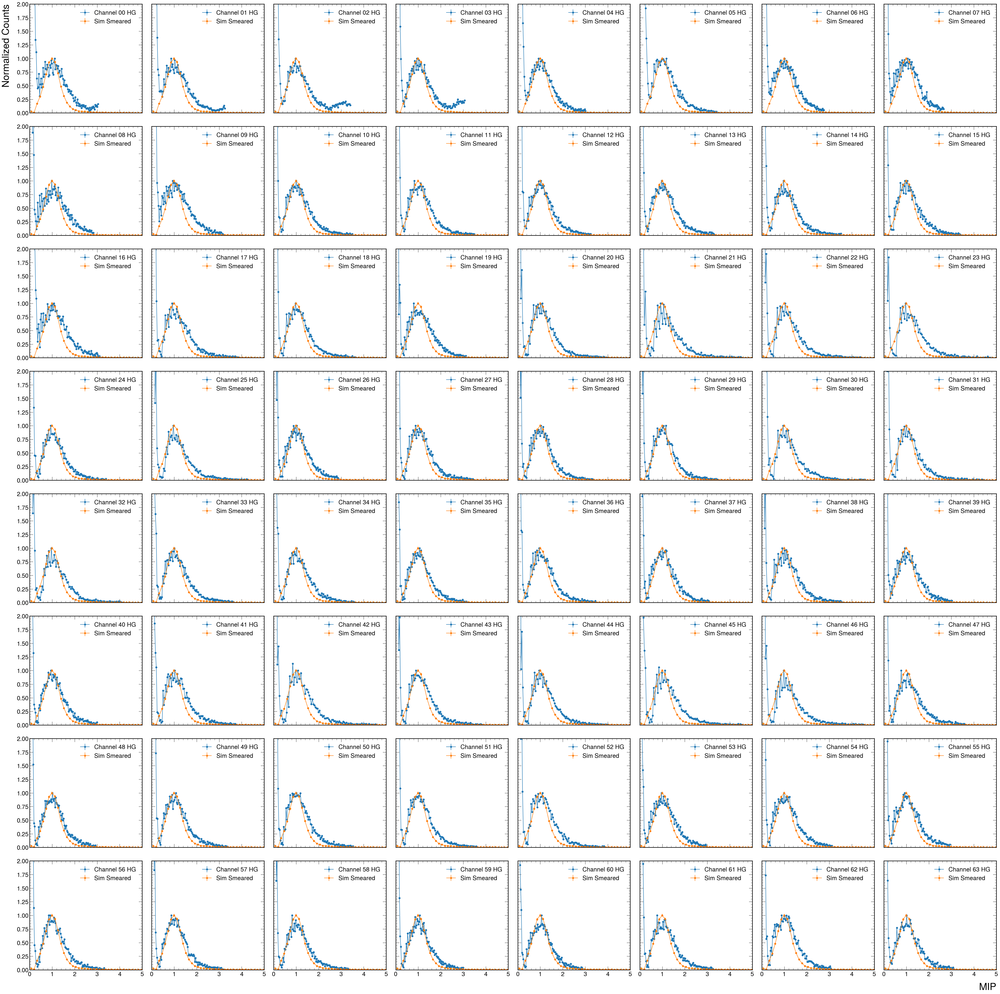

In [74]:
fig, ax = plt.subplots(num_channels//8,8,figsize=(50,50),sharex=True,sharey=True)
data_hg = []
data_e = []
for i in range(num_channels):
    plt.sca(ax[i//8][i%8])
    board_cut = free_cosmic_df['CAEN']==0
    channel_cut = free_cosmic_df[board_cut]['channel']==i

    bins, edges = np.histogram(np.array(free_cosmic_df[board_cut][channel_cut]["HG"],dtype=int)-free_pedestal[i*2+1]-3*free_sigma[i*2+1],bins=100,range=(0,7500),density=True)
    centers = edges[1:]/2+edges[:-1]/2

    plt.ylim(0,2)
    try:
        coeff, _ = curve_fit(gaus,centers[11:],bins[11:],p0=(8.39387137e-05, 3.17774273e+03, 1.51544717e+03),sigma=1/bins[11:])
        x = np.linspace(0,6000,100)
        hg = np.array(free_cosmic_df[board_cut][channel_cut]["HG"],dtype=int)-free_pedestal[i*2+1]-3*free_sigma[i*2+1]
        data_hg.append(coeff[1])
        data_e.append(abs(coeff[2]))

    except: 
        data_hg.append(999999)
        data_e.append(999999)
        pass
        
    plt.errorbar(centers/coeff[1],bins/max(bins[20:]),yerr=np.sqrt(bins),fmt='-o',label=f'Channel {i:02} HG')

    bins, edges = np.histogram(np.concatenate(data_energy_smear),bins=100,range=(0,0.01),density=True)
    centers = edges[1:]/2+edges[:-1]/2
    coeff, _ = curve_fit(gaus,np.array(centers)[1:],np.array(bins)[1:])
    plt.errorbar(centers/coeff[1],bins/max(bins[2:]),yerr=np.sqrt(bins)/max(bins[2:]),fmt='-o',label=f'Sim Smeared')
    
    plt.xlim(0,5)
    plt.legend()

    
ax[0, 0].set_ylabel('Normalized Counts', fontsize=35, labelpad=20)
ax[-1, -1].set_xlabel('MIP', fontsize=35, labelpad=20)
    
plt.tight_layout()
plt.savefig('output/mip_free.png')
plt.show()

Text(0, 1, 'Sum Event Energy (MeV)')

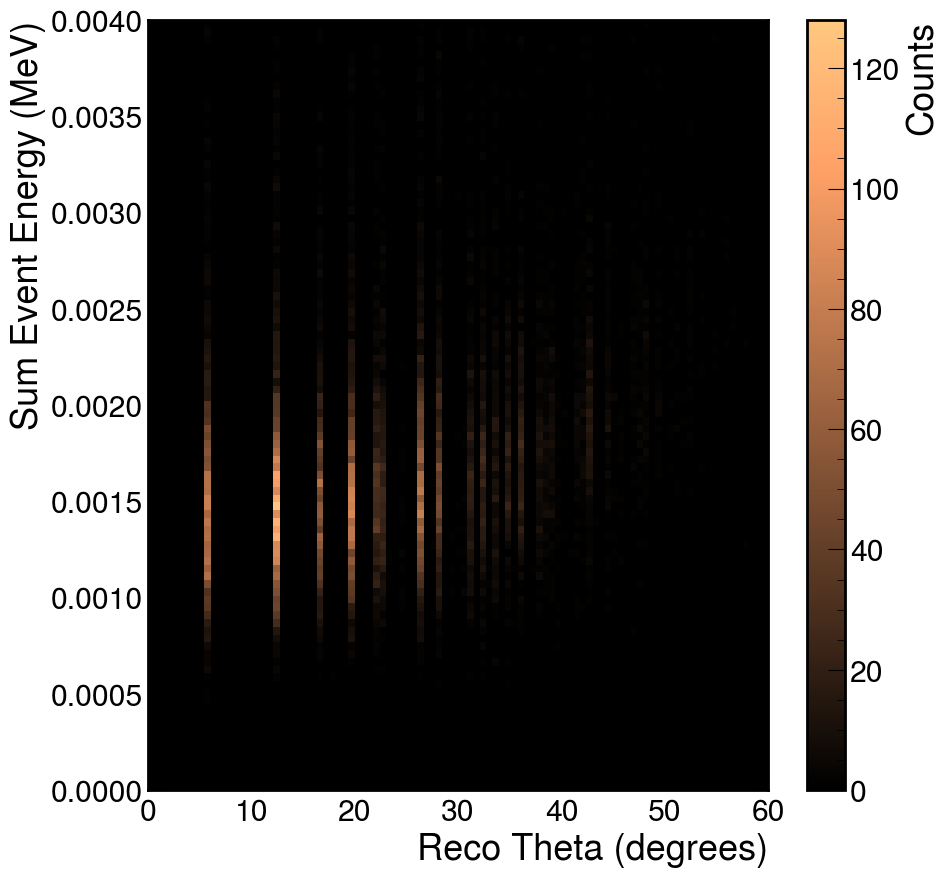

In [75]:
H, xedges, yedges = np.histogram2d(
    np.array(data_theta),
    np.array(np.sum(data_energy_smear,axis=-1)),
    bins=(np.linspace(0,60,100), np.linspace(0,4/1000,100))
    
)

X, Y = np.meshgrid(np.array(xedges,dtype=float), np.array(yedges,dtype=float))

plt.pcolormesh(X, Y, H.T, cmap="copper")
plt.colorbar(label='Counts')
plt.xlabel("Reco Theta (degrees)")
plt.ylabel('Sum Event Energy (MeV)')
#plt.yscale('log')

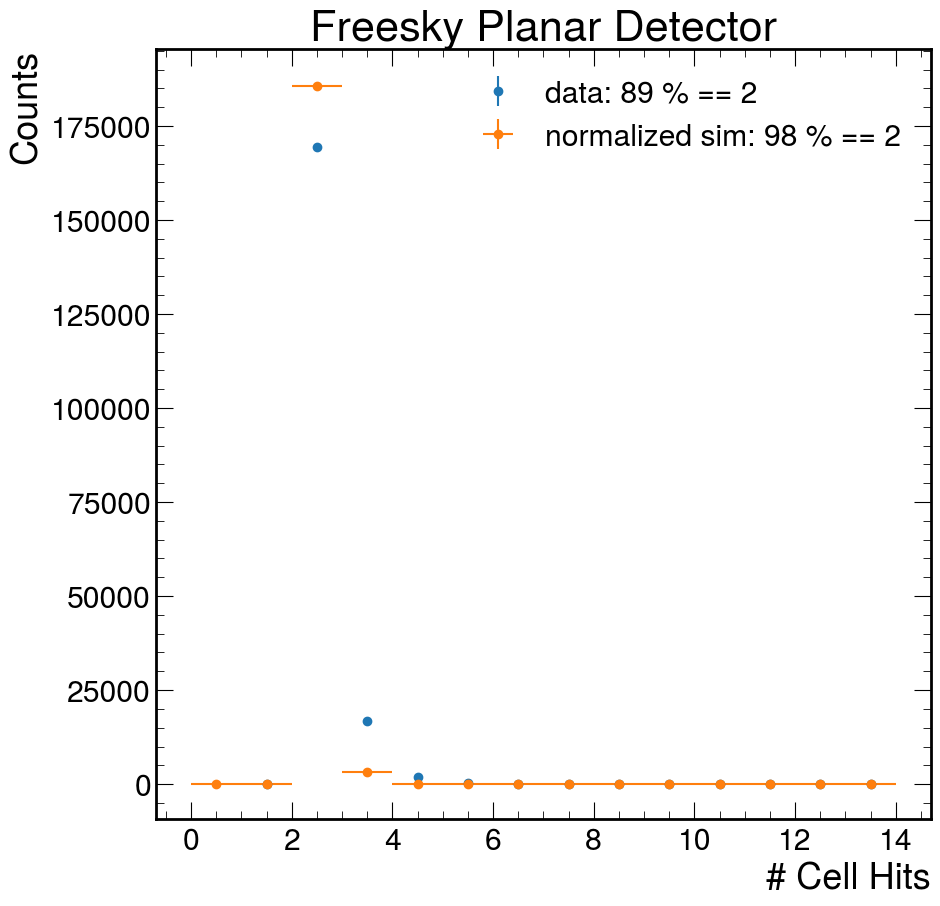

In [76]:
# --- Data ---
bins_d, edges = np.histogram(data_angle_free_hits, bins=np.arange(1,15,1))
centers = 0.5 * (edges[1:] + edges[:-1])

plt.errorbar(centers, bins_d, yerr=np.sqrt(bins_d), fmt='o', 
             label=f'data: {int(len(np.array(data_angle_free_hits)[np.array(data_angle_free_hits)==2])/len(np.array(data_angle_free_hits)[np.array(data_angle_free_hits)>0])*100)} % == 2')


# --- Simulation ---
bins_s, edges = np.histogram(ak.num(data_energy_smear, axis=1), bins=np.arange(0,15,1))
centers = 0.5 * (edges[1:] + edges[:-1])
bin_width = edges[1] - edges[0]
xerr = bin_width / 2
ratio = sum(bins_d) / sum(bins_s)

plt.errorbar(centers, bins_s*ratio, yerr=np.sqrt(bins_s*ratio), xerr=xerr, fmt='o', 
             label=f'normalized sim: {int(len(ak.num(data_energy_smear, axis=1)[ak.num(data_energy_smear, axis=1)==2])/len(ak.num(data_energy_smear, axis=1))*100)} % == 2')


plt.xlabel('# Cell Hits')
plt.ylabel('Counts')
#plt.yscale('log')
plt.title('Freesky Planar Detector')
plt.legend()


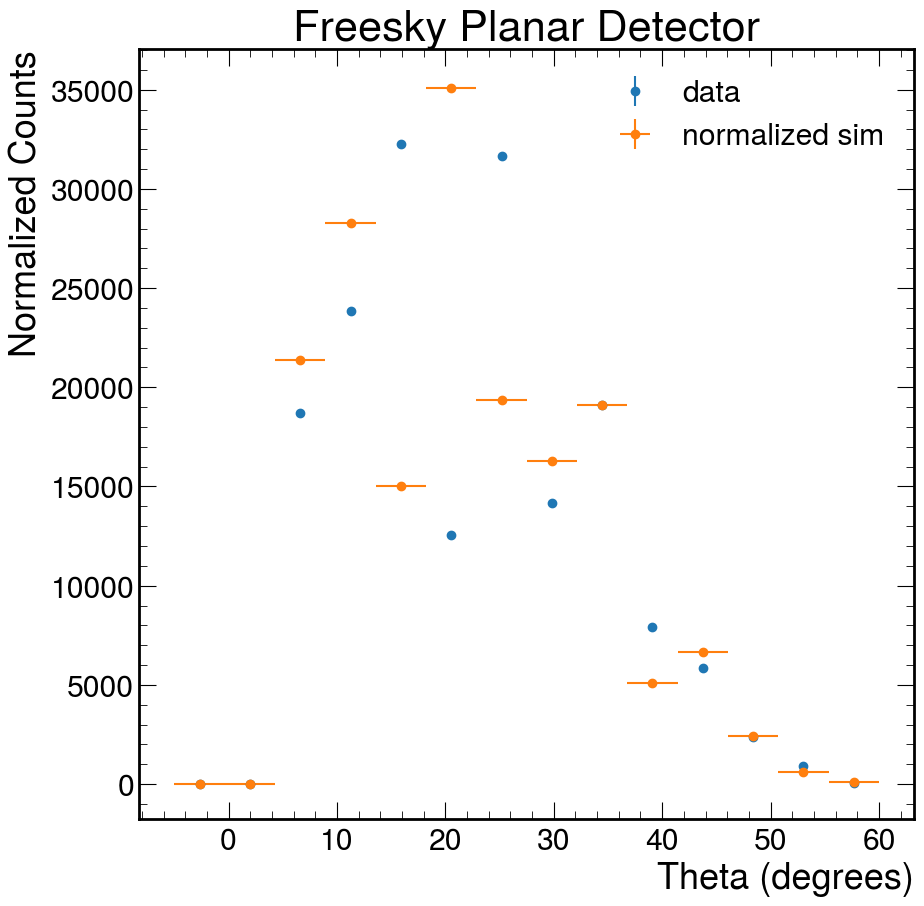

In [77]:
data_cell_cut = ak.num(data_energy_smear) == 2

# --- Data ---
bins_d, edges = np.histogram(np.array(data_angle_free)[:,0][np.array(data_angle_free_hits)==2], bins=np.linspace(-5,60,15))
centers = 0.5 * (edges[1:] + edges[:-1])

plt.errorbar(centers, bins_d, yerr=np.sqrt(bins_d), fmt='o', label='data')


# --- Simulation ---
bins_s, edges = np.histogram(data_theta[data_cell_cut], bins=np.linspace(-5,60,15))
centers = 0.5 * (edges[1:] + edges[:-1])
ratio = sum(bins_d) / sum(bins_s)

bin_width = edges[1] - edges[0]
xerr = bin_width / 2

plt.errorbar(centers, bins_s*ratio, yerr=np.sqrt(bins_s*ratio), xerr=xerr, fmt='o', label='normalized sim')


plt.xlabel('Theta (degrees)')
plt.ylabel('Normalized Counts')
#plt.yscale('log')
plt.title('Freesky Planar Detector')
plt.legend()


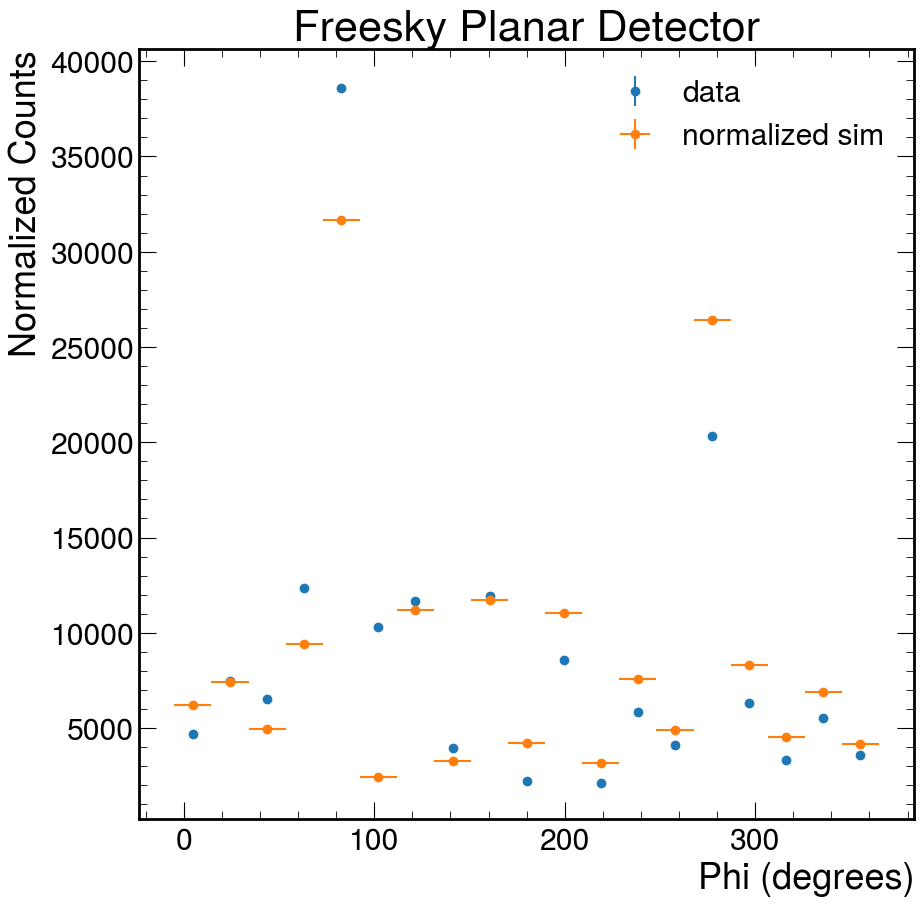

In [78]:
data_cell_cut = ak.num(data_energy_smear) == 2

# --- Data ---
bins_d, edges = np.histogram(np.mod(np.array(data_angle_free)[:,1][np.array(data_angle_free_hits)==2],360), bins=np.linspace(-5,365,20))
centers = 0.5 * (edges[1:] + edges[:-1])

plt.errorbar(centers, bins_d, yerr=np.sqrt(bins_d), fmt='o', label='data')


# --- Simulation ---
bins_s, edges = np.histogram(np.mod(data_phi[data_cell_cut],360), bins=np.linspace(-5,365,20))
centers = 0.5 * (edges[1:] + edges[:-1])

ratio = sum(bins_d) / sum(bins_s)

bin_width = edges[1] - edges[0]
xerr = bin_width / 2

plt.errorbar(centers, bins_s*ratio, yerr=np.sqrt(bins_s*ratio), xerr=xerr, fmt='o', label='normalized sim')


plt.xlabel('Phi (degrees)')
plt.ylabel('Normalized Counts')
#plt.yscale('log')
plt.title('Freesky Planar Detector')
plt.legend()


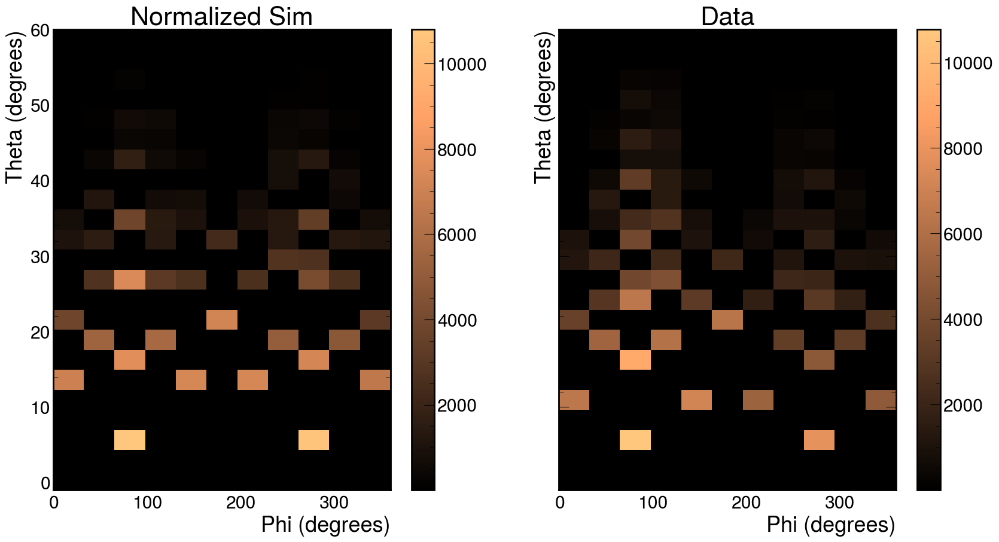

In [79]:
fig, ax = plt.subplots(1,2,figsize=(20,10),sharex=True,sharey=True)

theta_bin = np.linspace(-1, 60, 24) 
phi_bin = np.linspace(-1, 360, 12)
T, xedges, yedges = np.histogram2d(np.mod(np.array(data_angle_free)[:,1][np.array(data_angle_free_hits)==2], 360),np.array(data_angle_free)[:,0][np.array(data_angle_free_hits)==2],bins=[phi_bin,theta_bin])

H, xedges, yedges = np.histogram2d(np.mod(np.array(data_phi)[data_cell_cut], 360),np.array(data_theta)[data_cell_cut],bins=[phi_bin,theta_bin])
ratio = sum(np.concatenate(T))/sum(np.concatenate(H))
plt.sca(ax[0])
plt.imshow(
    H.T*ratio,
    origin="lower", 
    extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
    aspect="auto",
    cmap='copper', vmin=1
)
plt.title('Normalized Sim')
plt.xlabel('Phi (degrees)')
plt.ylabel('Theta (degrees)')
plt.colorbar()

plt.sca(ax[1])
plt.imshow(
    T.T,
    origin="lower", 
    extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
    aspect="auto",
    cmap='copper', vmin=1
)
plt.title('Data')
plt.xlabel('Phi (degrees)')
plt.ylabel('Theta (degrees)')
plt.colorbar()

/tmp/ipykernel_3637384/1366595636.py:36: RuntimeWarning:

divide by zero encountered in divide

/tmp/ipykernel_3637384/1366595636.py:36: RuntimeWarning:

invalid value encountered in divide



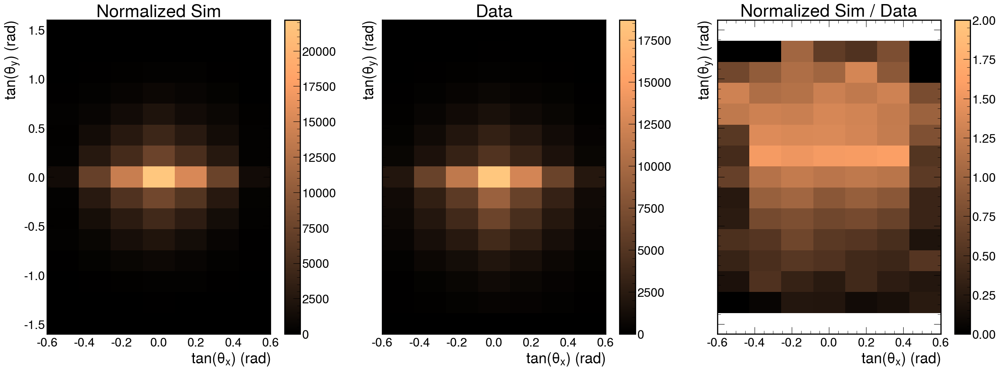

In [80]:
fig, ax = plt.subplots(1,3,figsize=(30,10),sharex=True,sharey=True)

theta_bin = np.linspace(-1.6, 1.6, 16) 
phi_bin = np.linspace(-0.6, 0.6, 8)
T, xedges, yedges = np.histogram2d(np.array(data_angle_xy_free)[np.array(data_angle_free_hits)==2][:,0],np.array(data_angle_xy_free)[np.array(data_angle_free_hits)==2][:,1],bins=[phi_bin,theta_bin])

H, xedges, yedges = np.histogram2d(np.array(reco_data_angle_1[:,0])[data_cell_cut],np.array(reco_data_angle_1[:,1])[data_cell_cut],bins=[phi_bin,theta_bin])
ratio = sum(np.concatenate(T))/sum(np.concatenate(H))
plt.sca(ax[0])
plt.imshow(
    H.T*ratio,
    origin="lower", 
    extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
    aspect="auto",
    cmap='copper',
)
plt.title('Normalized Sim')
plt.xlabel(r'tan($\theta_x$) (rad)')
plt.ylabel(r'tan($\theta_y$) (rad)')
plt.colorbar()

plt.sca(ax[1])
plt.imshow(
    T.T,
    origin="lower", 
    extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
    aspect="auto",
    cmap='copper',
)
plt.title('Data')
plt.xlabel(r'tan($\theta_x$) (rad)')
plt.ylabel(r'tan($\theta_y$) (rad)')
plt.colorbar()

plt.sca(ax[2])
div = np.divide(H,T)
plt.imshow(
    div.T*ratio,
    origin="lower", 
    extent=[xedges[0], xedges[-1], yedges[0], yedges[-1]],
    aspect="auto",
    cmap='copper',
    vmax=2, vmin=0
)
plt.title('Normalized Sim / Data')
plt.xlabel(r'tan($\theta_x$) (rad)')
plt.ylabel(r'tan($\theta_y$) (rad)')
plt.colorbar()